# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [1]:
# if plotnine is not installed in Jupter then use the following command to install it 

Running this project require the following imports 

In [2]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
import scipy.cluster.hierarchy as sch
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [3]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



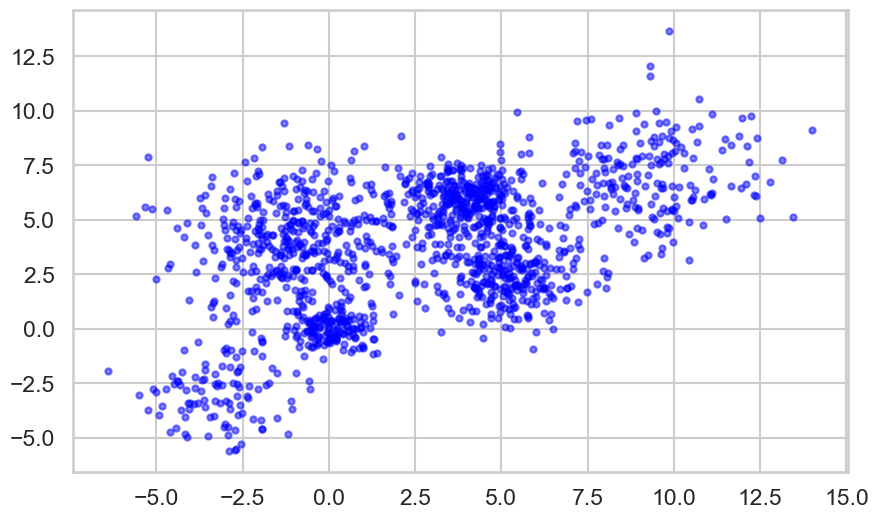

In [4]:
plt.rcParams['figure.figsize'] = [10,6]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

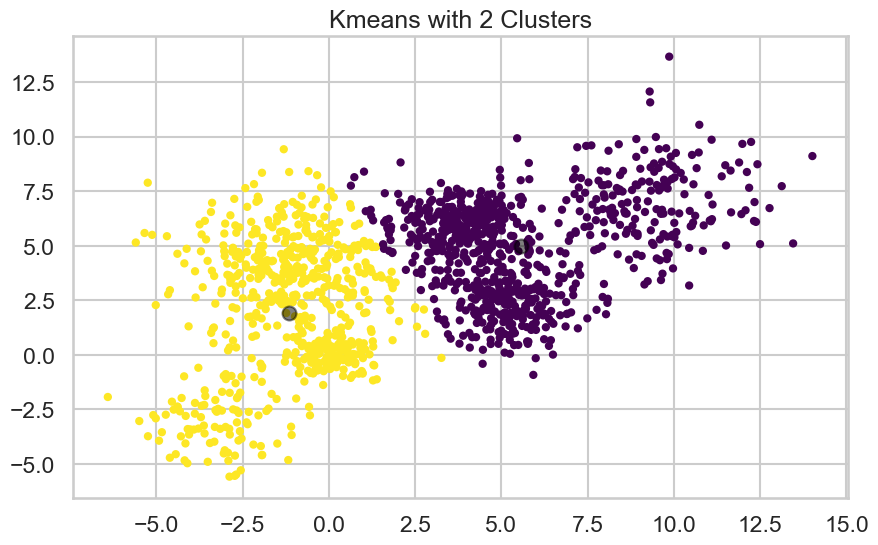

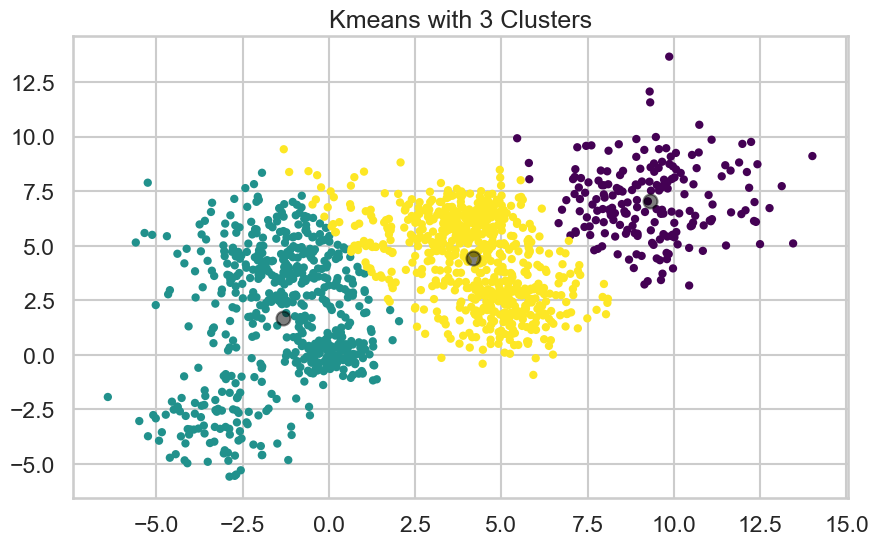

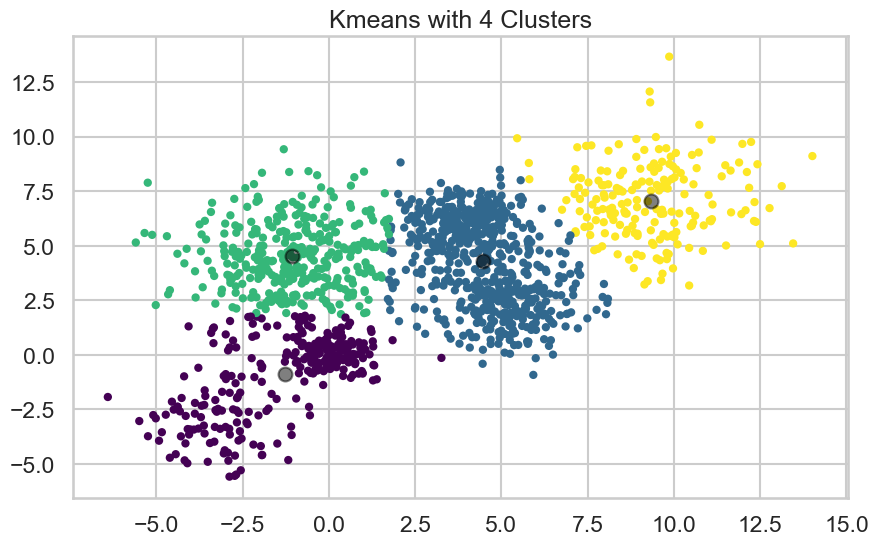

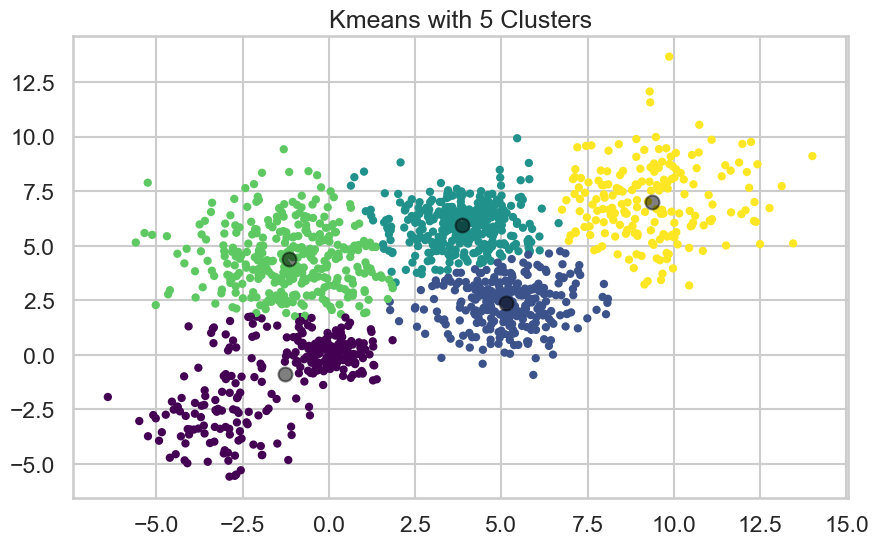

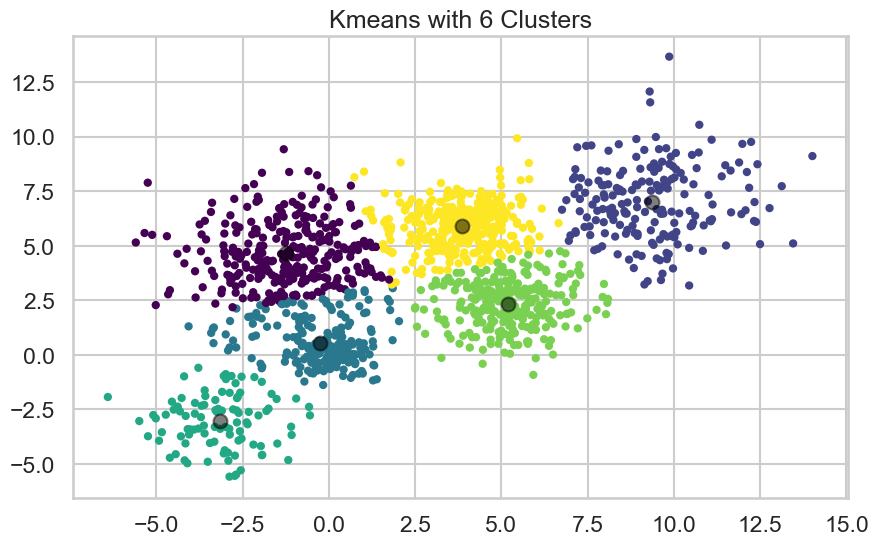

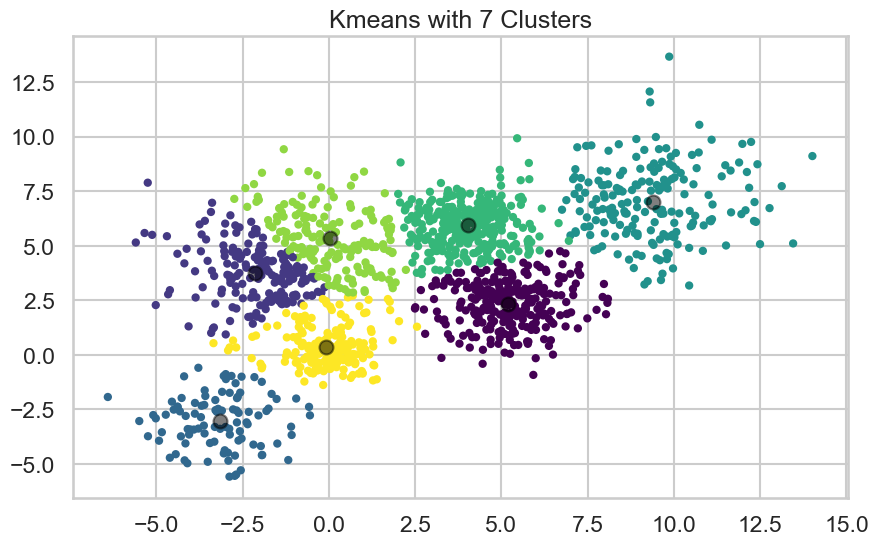

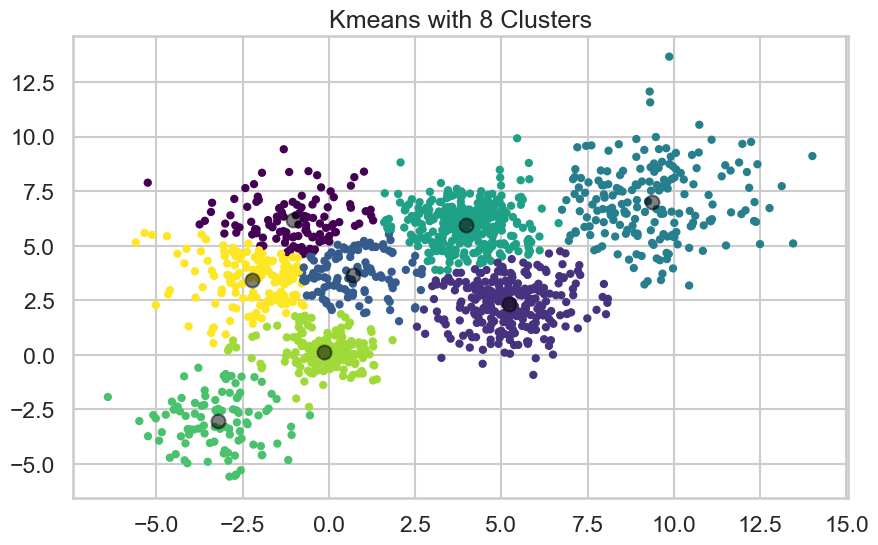

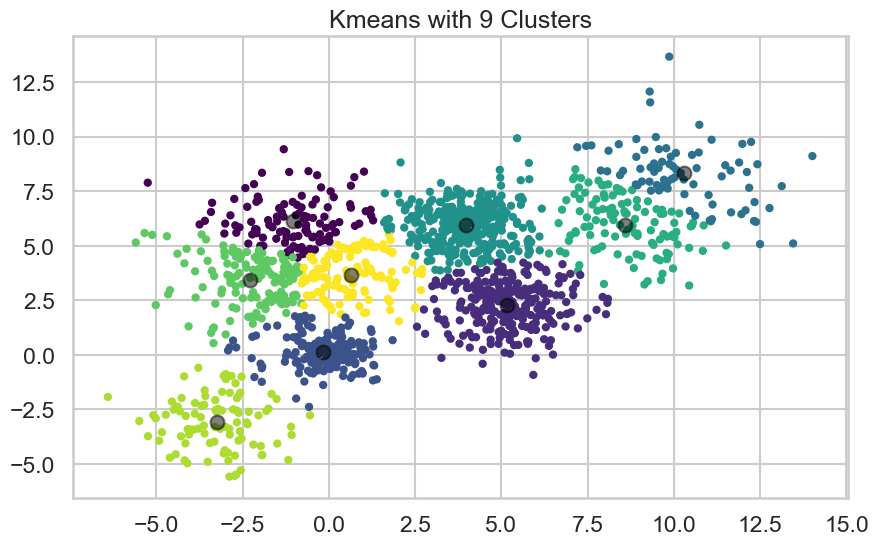

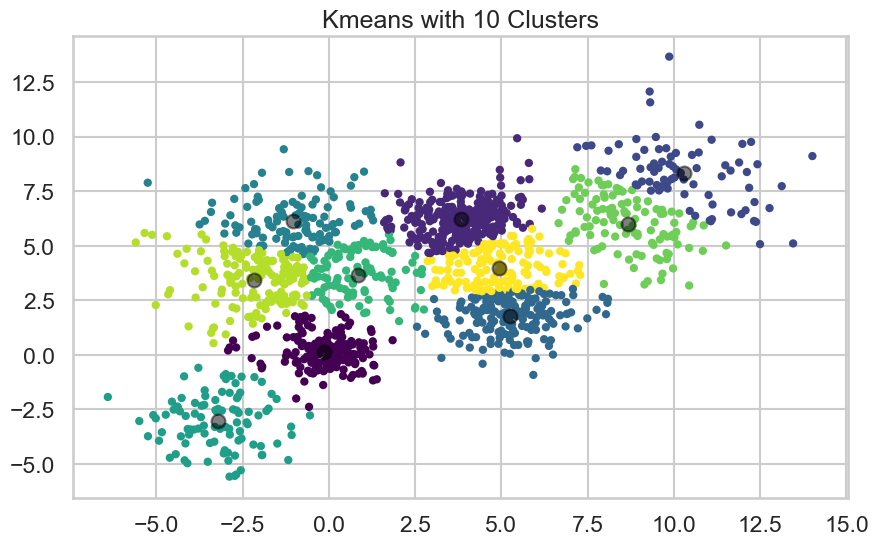

In [13]:
# Kmeans with different K values and displaying results.
y_kmeans = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(Multi_blob_Data)
    y_kmeans.append(kmeans.inertia_) #Inertia is defined as the sum of squared distances of data points to their closest cluster center, higher K gives lower inertia.
    plt.figure()
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=kmeans.labels_, s=20, cmap='viridis')
    centers = kmeans.cluster_centers_
    plt.scatter(centers[:, 0], centers[:, 1], c='black', s=100, alpha=0.5);
    plt.title('Kmeans with %d Clusters' % k);

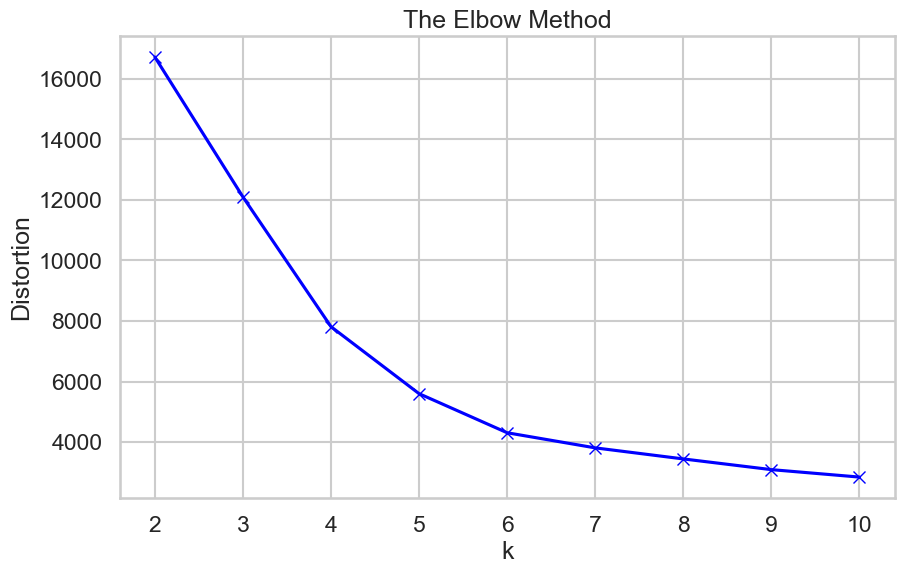

In [6]:
# Plot of elbow function versus K.
# The idea here is to plot the total inertia score, for different values of K and identify K beyond which the inertia doesn’t change much.
distortions = []
for k in range(2,11):
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(Multi_blob_Data)
    distortions.append(kmeanModel.inertia_)
    
plt.figure(figsize=(10,6))
plt.plot(range(2,11), distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method')
plt.show()

Best Silhouette score is 0.486145


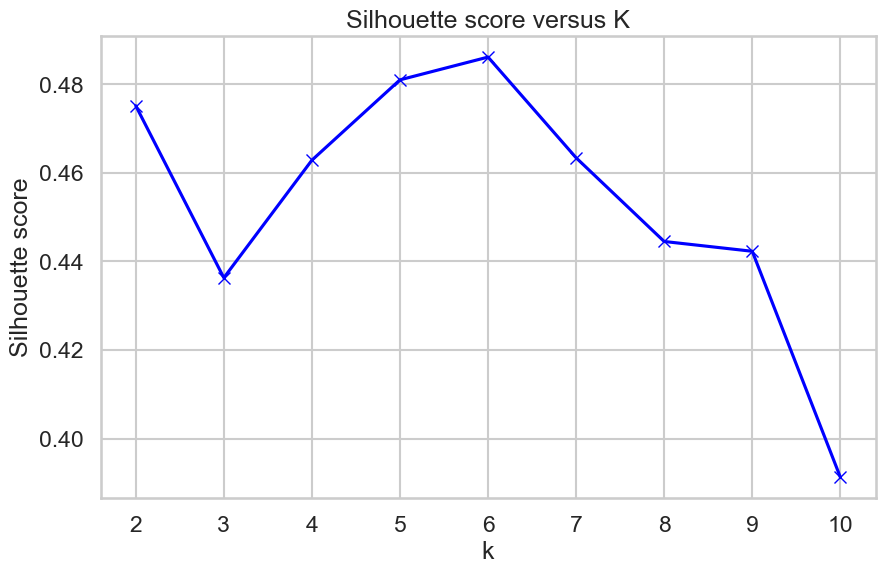

In [7]:
# The Silhouette score is used to measure the degree of separation between clusters.
# Silhouette score observing the local maxima is used to determine the optimum number of clusters along with the Elbow plot.
score = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(Multi_blob_Data)
    score.append(silhouette_score(Multi_blob_Data, kmeans.labels_, metric='euclidean'))
    
# Printing all Silhouette scores
#    for i in range(0, len(score)):
#        print(k)
#        print('Silhouetter Score is %.3f' % score[i])

# Storing best Silhouette score (local maxima).
max_silhouette_score = max(score)
print('Best Silhouette score is %.6f' % max_silhouette_score)

# Plot of silhouette_score versus K.
plt.plot(range(2,11), score, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette score')
plt.title('Silhouette score versus K')
plt.show()

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

### Resulting Clusters

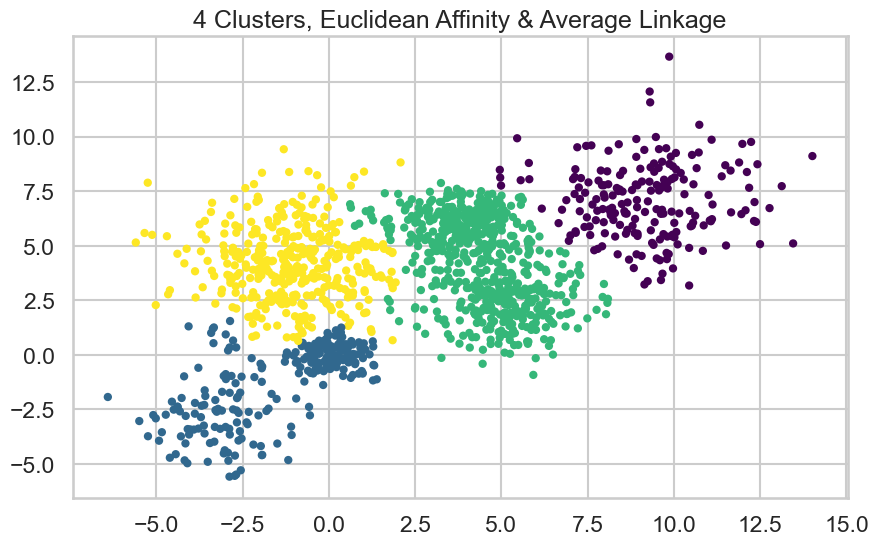

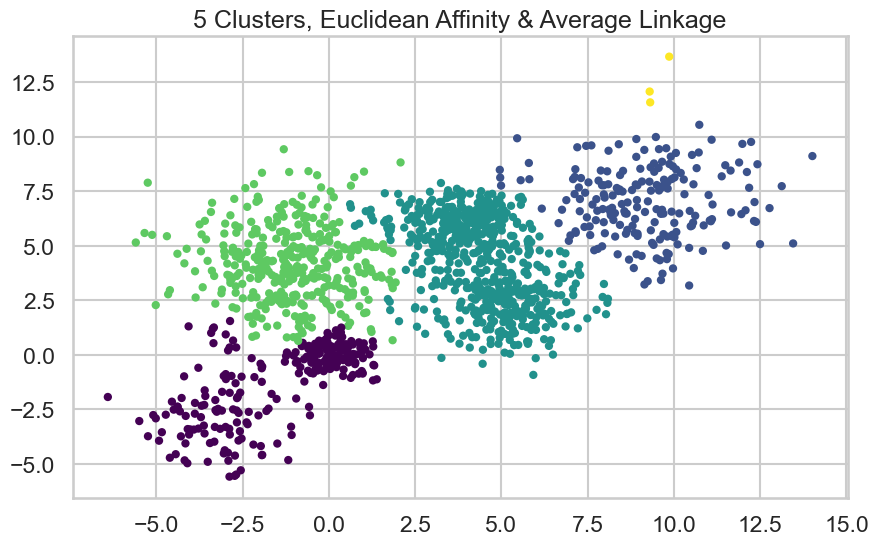

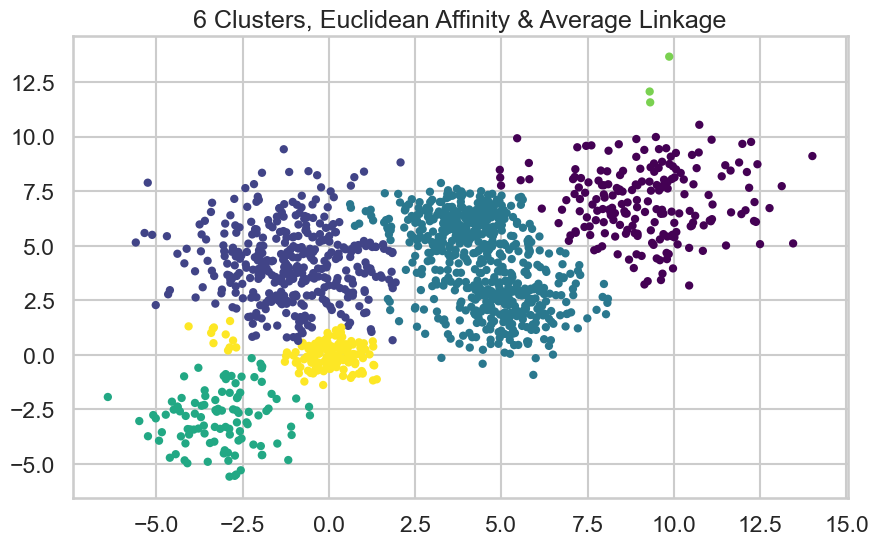

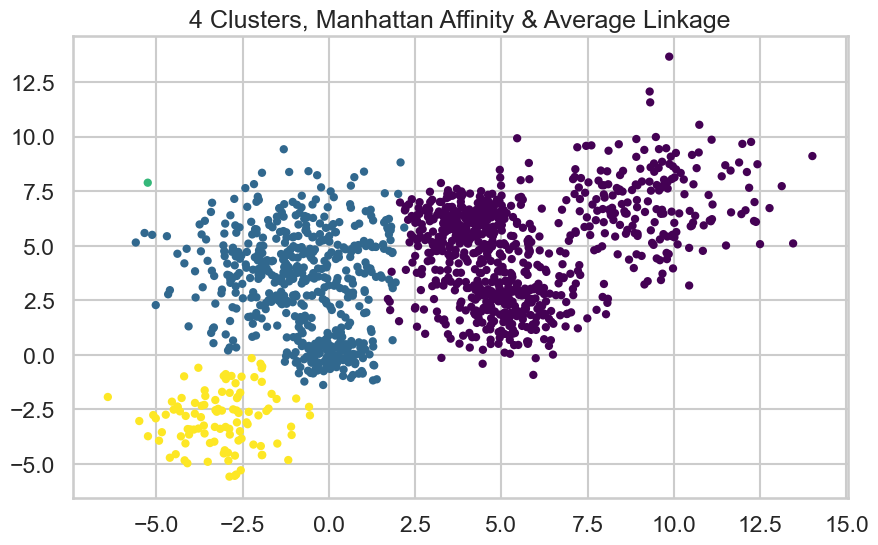

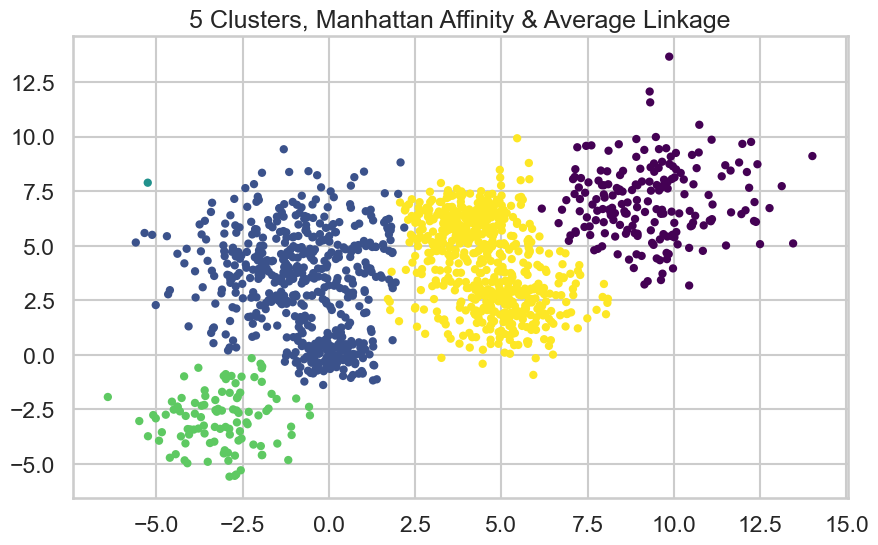

...

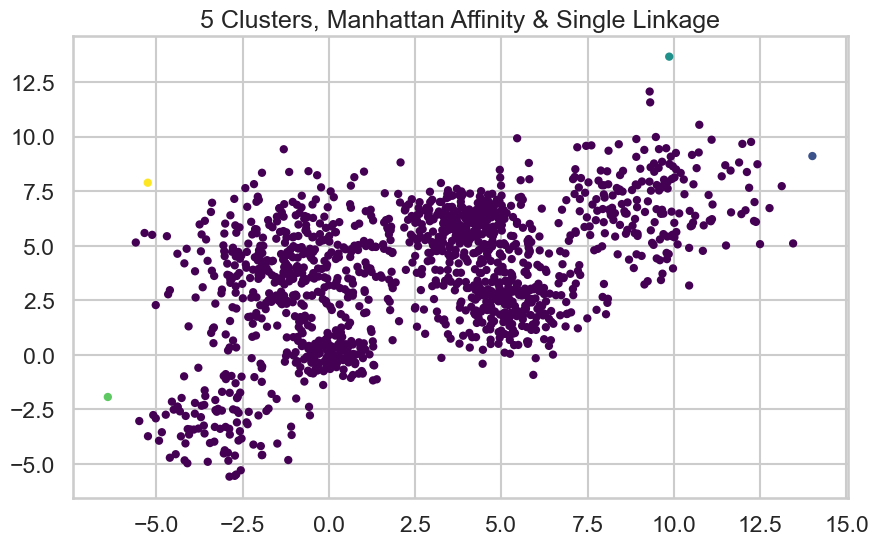

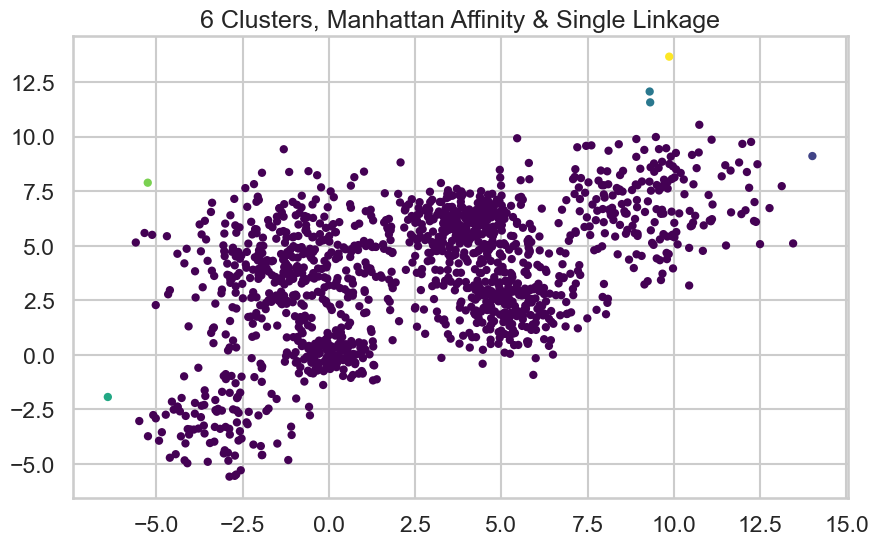

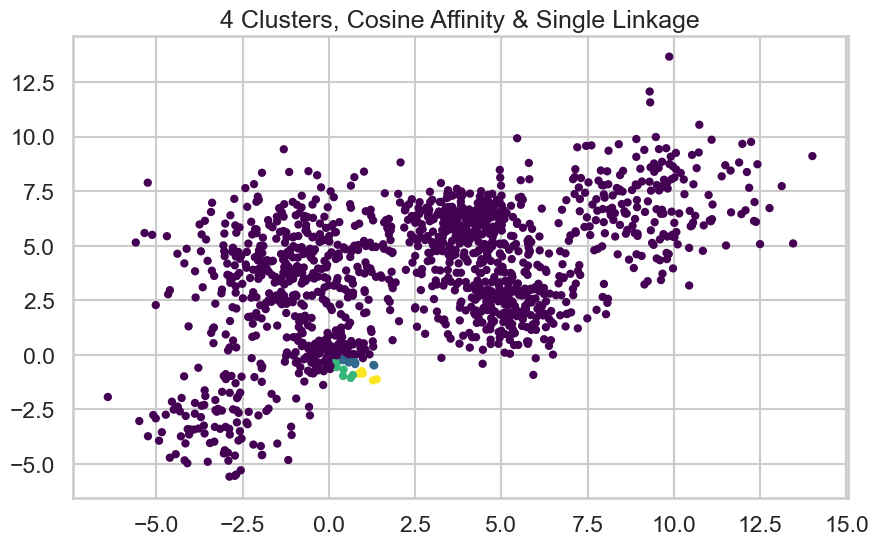

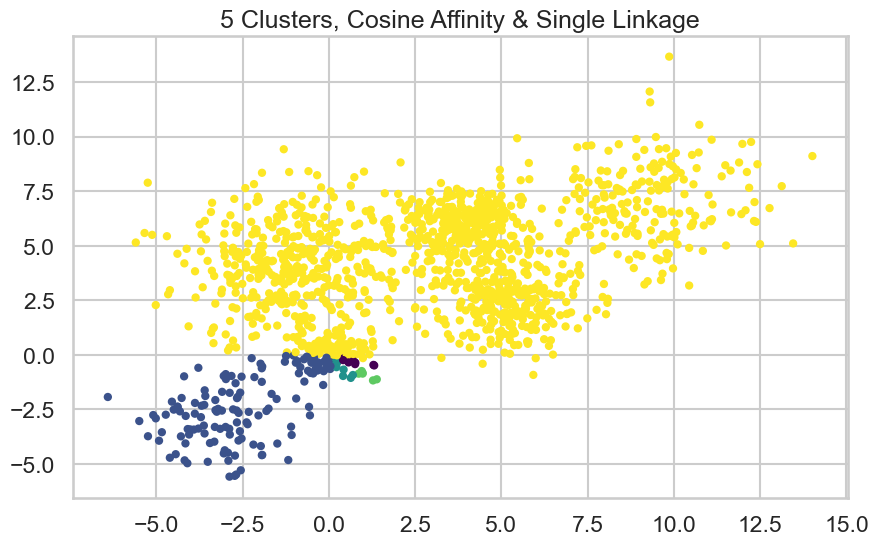

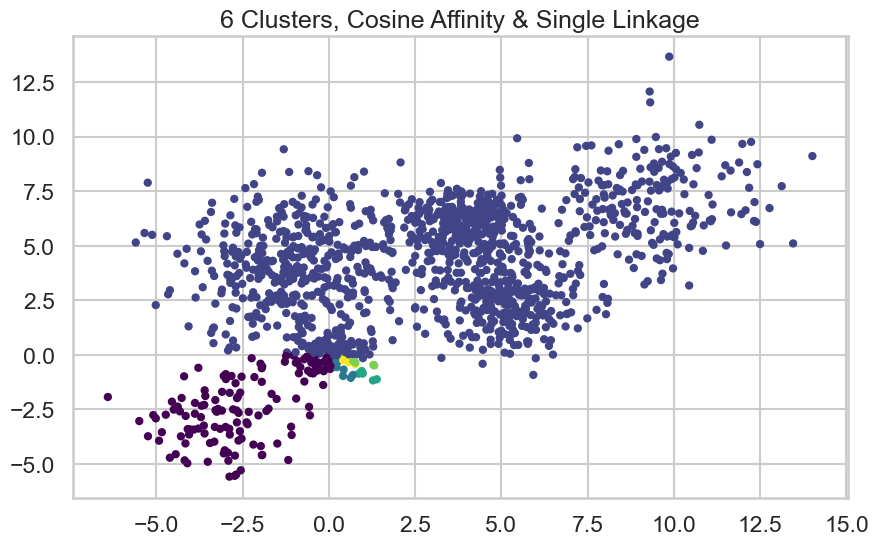

In [8]:
for k in range(4,7):
    model = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average')
    model.fit(Multi_blob_Data)
    plt.figure() # VERY Important to plot all figures.
    plt.title('%d Clusters, Euclidean Affinity & Average Linkage' % k)
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=model.labels_, s=20, cmap='viridis')

for k in range(4,7):
    model = AgglomerativeClustering(n_clusters=k, affinity='manhattan', linkage='average')
    model.fit(Multi_blob_Data)
    plt.figure()
    plt.title('%d Clusters, Manhattan Affinity & Average Linkage' % k)
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=model.labels_, s=20, cmap='viridis')
    
for k in range(4,7):
    model = AgglomerativeClustering(n_clusters=k, affinity='cosine', linkage='average')
    model.fit(Multi_blob_Data)
    plt.figure()
    plt.title('%d Clusters, Cosine Affinity & Average Linkage' % k)
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=model.labels_, s=20, cmap='viridis')
    
for k in range(4,7):
    model = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='single')
    model.fit(Multi_blob_Data)
    plt.figure()
    plt.title('%d Clusters, Euclidean Affinity & Single Linkage' % k)
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=model.labels_, s=20, cmap='viridis')
    
for k in range(4,7):
    model = AgglomerativeClustering(n_clusters=k, affinity='manhattan', linkage='single')
    model.fit(Multi_blob_Data)
    plt.figure()
    plt.title('%d Clusters, Manhattan Affinity & Single Linkage' % k)
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=model.labels_, s=20, cmap='viridis')
    
for k in range(4,7):
    model = AgglomerativeClustering(n_clusters=k, affinity='cosine', linkage='single')
    model.fit(Multi_blob_Data)
    plt.figure()
    plt.title('%d Clusters, Cosine Affinity & Single Linkage' % k)
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=model.labels_, s=20, cmap='viridis')    

### Calculating Silhouette Scores

In [9]:
t1 = []
t2 = []
t3 = []
t4 = []
t5 = []
t6 = []
temp = []
# Scenario 1 
print('**Euclidean Affinity and Average Linkage**')
for k in range(4,9):
    model = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average')
    model.fit(Multi_blob_Data)
    labels = model.labels_ #The labels_ property returns an array of integers where the values correspond to the distinct categories.
    score1 = silhouette_score(Multi_blob_Data, labels, metric='euclidean')
    t1.append(silhouette_score(Multi_blob_Data, labels, metric='euclidean'))
    print('Silhouette score using %d Clusters: %.6f' % (k, score1))
    # Best Silhouette score between all cluster options.
    for i in range(0, len(t1)):
        temp1 = max(t1)
# Scenario 2
print('**Manhattan Affinity and Average Linkage**')
for k in range(4,9):
    model = AgglomerativeClustering(n_clusters=k, affinity='manhattan', linkage='average')
    model.fit(Multi_blob_Data)
    score2 = silhouette_score(Multi_blob_Data, model.labels_, metric='manhattan')
    t2.append(silhouette_score(Multi_blob_Data, model.labels_, metric='manhattan'))
    print('Silhouette score using %d Clusters: %.6f' % (k, score2))
    # Best Silhouette score between all cluster options.
    for i in range(0, len(t2)):
        temp2 = max(t2)
# Scenario 3
print('**Cosine Affinity and Average Linkage**')
for k in range(4,9):
    model = AgglomerativeClustering(n_clusters=k, affinity='cosine', linkage='average')
    model.fit(Multi_blob_Data)
    score3 = silhouette_score(Multi_blob_Data, model.labels_, metric='cosine')
    t3.append(silhouette_score(Multi_blob_Data, model.labels_, metric='cosine'))
    print('Silhouette score using %d Clusters: %.6f' % (k, score3))
    # Best Silhouette score between all cluster options.
    for i in range(0, len(t3)):
        temp3 = max(t3)
# Scenario 4
print('**Euclidean Affinity and Single Linkage**')
for k in range(4,9):
    model = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='single')
    model.fit(Multi_blob_Data)
    score4 = silhouette_score(Multi_blob_Data, model.labels_, metric='euclidean')
    t4.append(silhouette_score(Multi_blob_Data, model.labels_, metric='euclidean'))
    print('Silhouette score using %d Clusters: %.6f' % (k, score4))
    # Best Silhouette score between all cluster options.
    for i in range(0, len(t4)):
        temp4 = max(t4)
# Scenario 5
print('**Manhattan Affinity and Single Linkage**')
for k in range(4,9):
    model = AgglomerativeClustering(n_clusters=k, affinity='manhattan', linkage='single')
    model.fit(Multi_blob_Data)
    score5 = silhouette_score(Multi_blob_Data, model.labels_, metric='manhattan')
    t5.append(silhouette_score(Multi_blob_Data, model.labels_, metric='manhattan'))
    print('Silhouette score using %d Clusters: %.6f' % (k, score5))
    # Best Silhouette score between all cluster options.
    for i in range(0, len(t5)):
        temp5 = max(t5)
# Scenario 6
print('**Cosine Affinity and Single Linkage**')
for k in range(4,9):
    model = AgglomerativeClustering(n_clusters=k, affinity='cosine', linkage='single')
    model.fit(Multi_blob_Data)
    score6 = silhouette_score(Multi_blob_Data, model.labels_, metric='cosine')
    t6.append(silhouette_score(Multi_blob_Data, model.labels_, metric='cosine'))
    print('Silhouette score using %d Clusters: %.6f' % (k, score6))
    # Best Silhouette score between all cluster options.
    for i in range(0, len(t6)):
        temp6 = max(t6)
# Best Silhouette score.
max_silhouette_score = max(temp1,temp2,temp3,temp4,temp5,temp6)
print('Best Silhouette score: %.6f' %max_silhouette_score)

### Best is 4 clusters, Cosine Affinity and Average Linkage.

**Euclidean Affinity and Average Linkage**
Silhouette score using 4 Clusters: 0.449058
Silhouette score using 5 Clusters: 0.433188
Silhouette score using 6 Clusters: 0.414788
Silhouette score using 7 Clusters: 0.362873
Silhouette score using 8 Clusters: 0.323907
**Manhattan Affinity and Average Linkage**
Silhouette score using 4 Clusters: 0.395094
Silhouette score using 5 Clusters: 0.409954
Silhouette score using 6 Clusters: 0.391288
Silhouette score using 7 Clusters: 0.393884
Silhouette score using 8 Clusters: 0.409976
**Cosine Affinity and Average Linkage**
Silhouette score using 4 Clusters: 0.781335
Silhouette score using 5 Clusters: 0.726348
Silhouette score using 6 Clusters: 0.671986
Silhouette score using 7 Clusters: 0.704074
Silhouette score using 8 Clusters: 0.699942
**Euclidean Affinity and Single Linkage**
Silhouette score using 4 Clusters: 0.207401
Silhouette score using 5 Clusters: 0.174008
Silhouette score using 6 Clusters: 0.087056
Silhouette score using 7 Clusters: -0.06

### Dendrogram 1 using Average Linkage

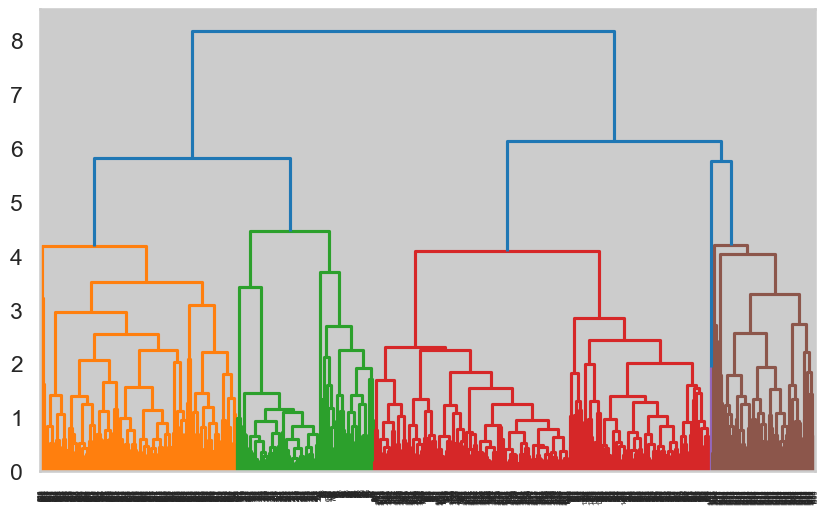

In [10]:
dendrogram1 = sch.dendrogram(sch.linkage(Multi_blob_Data, method='average'))

### Dendrogram 2 using single Linkage

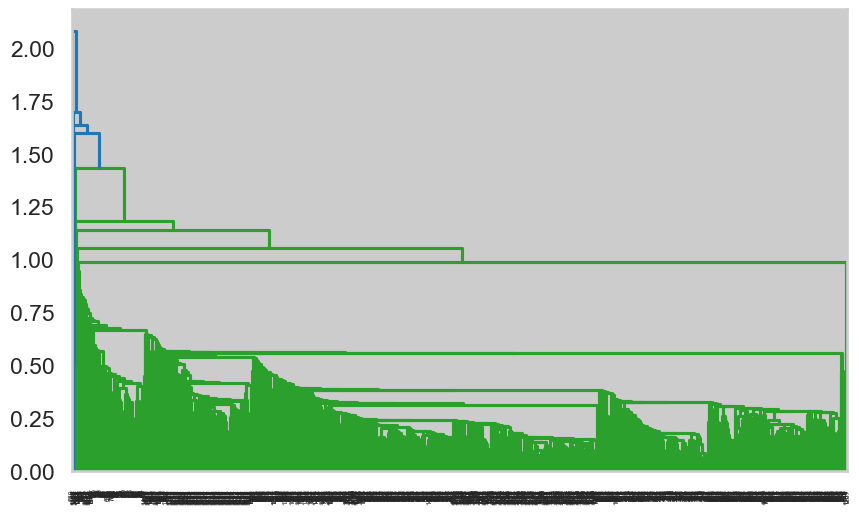

In [11]:
dendrogram2 = sch.dendrogram(sch.linkage(Multi_blob_Data, method='single'))

### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

## Plotting Silhouette Score

In [38]:
#score = []
#for i in np.arange(0.1,3.58,0.58):
#    for j in range(5,30,5):
#        DB = DBSCAN(eps = i, min_samples = j).fit(Multi_blob_Data)
#        score.append(silhouette_score(Multi_blob_Data, DB.labels_, metric='euclidean'))
#
#        print("Silhouette Coefficient: %0.3f" % silhouette_score(Multi_blob_Data, DB.labels_))

## Plotting Resulting Clusters

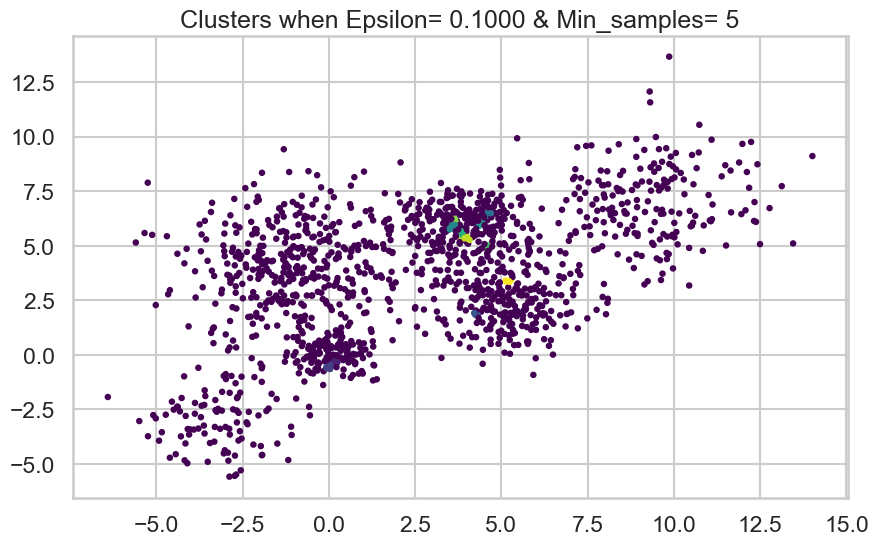

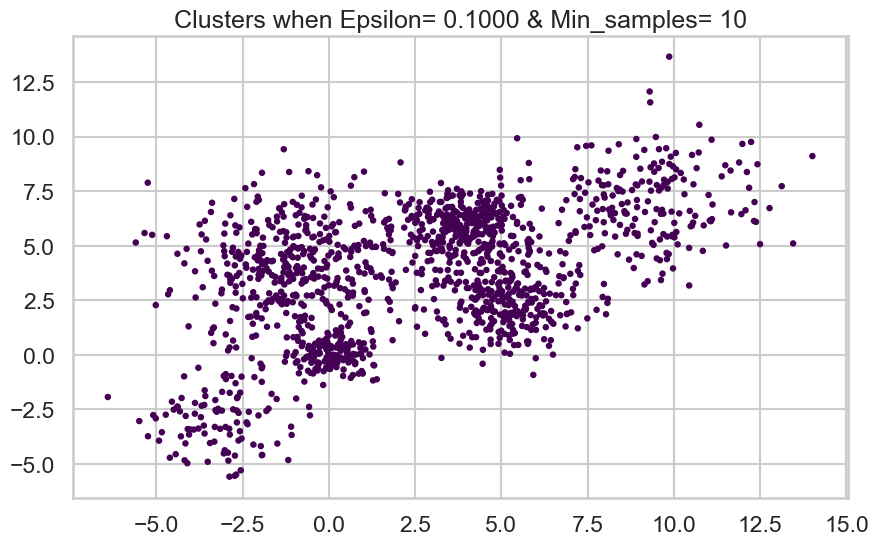

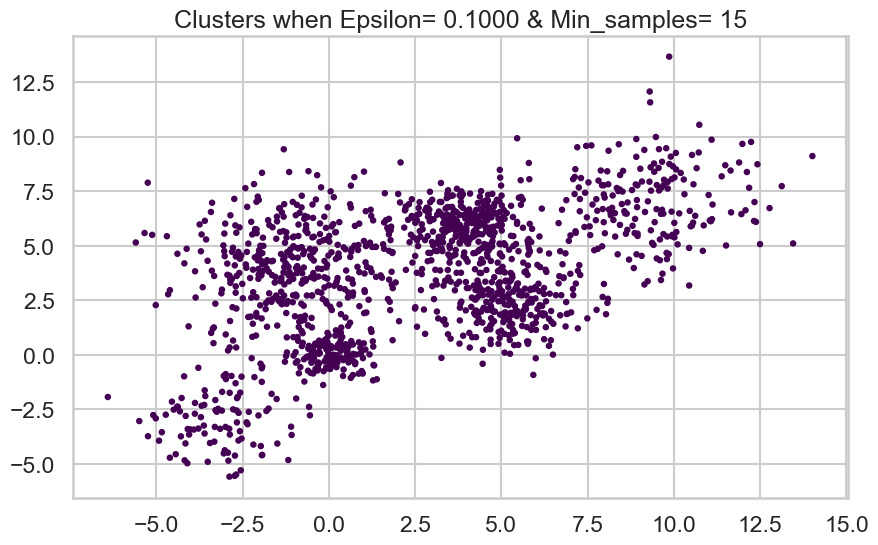

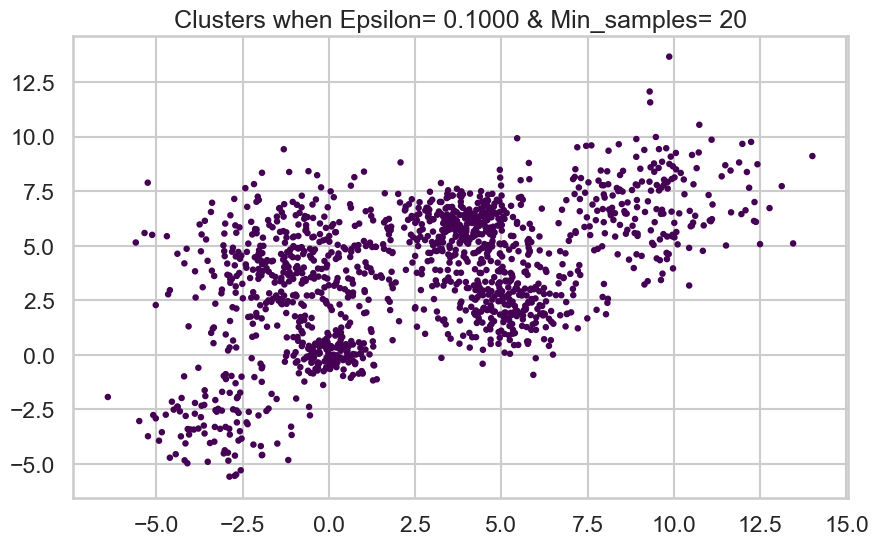

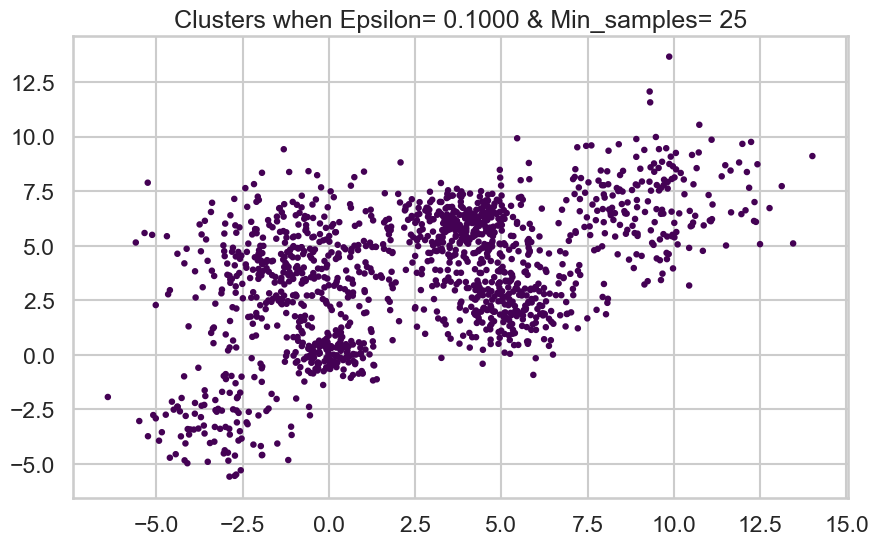

...

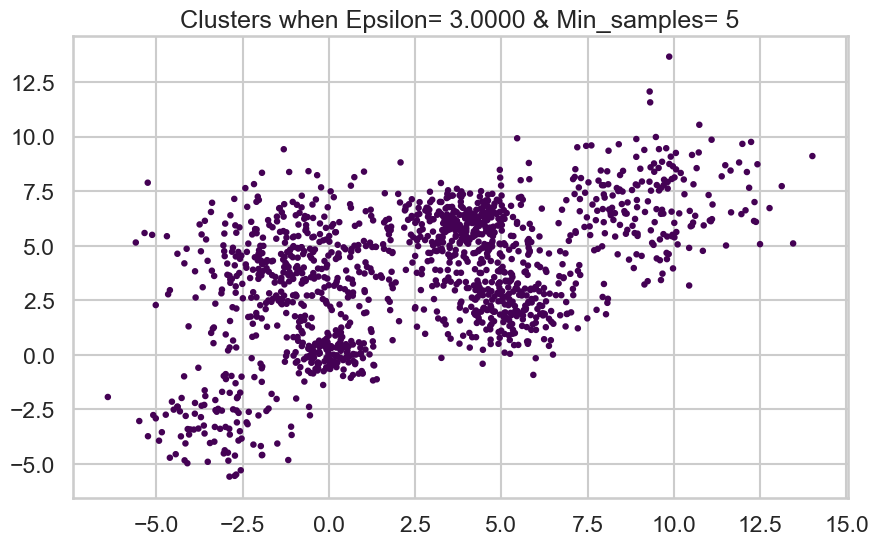

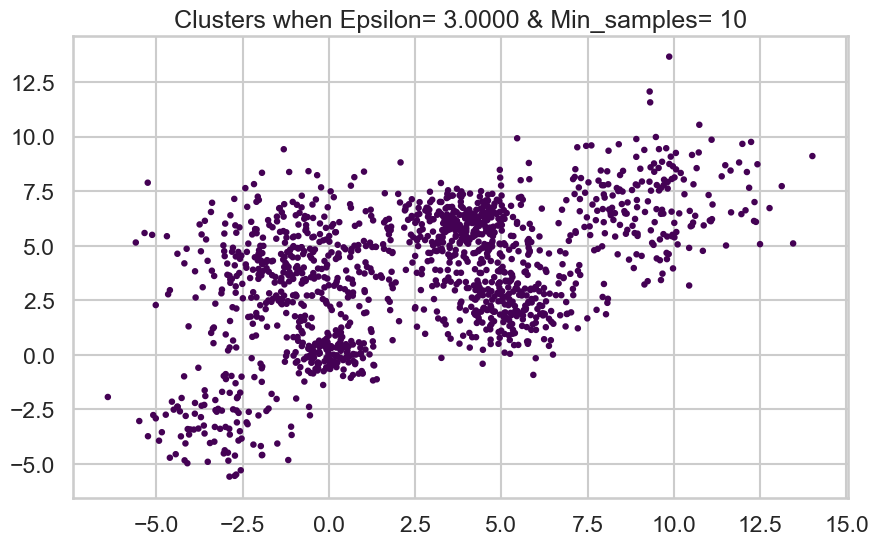

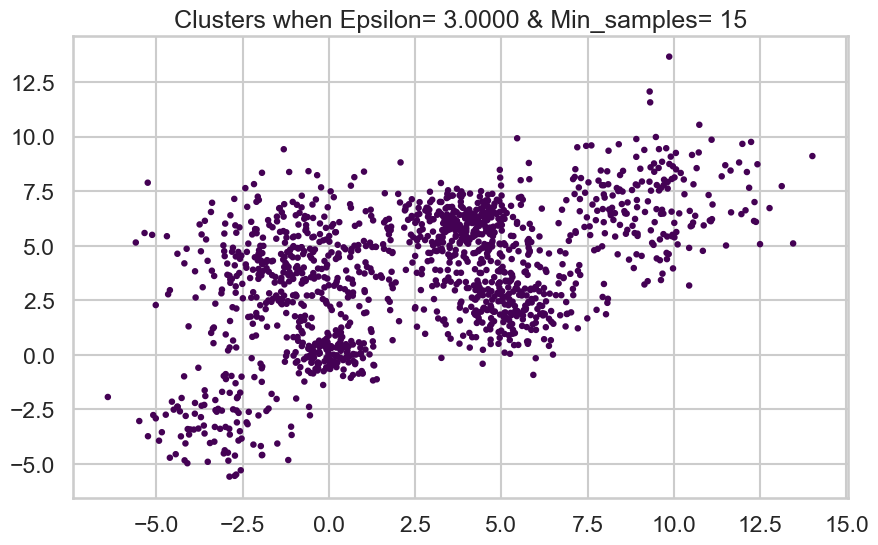

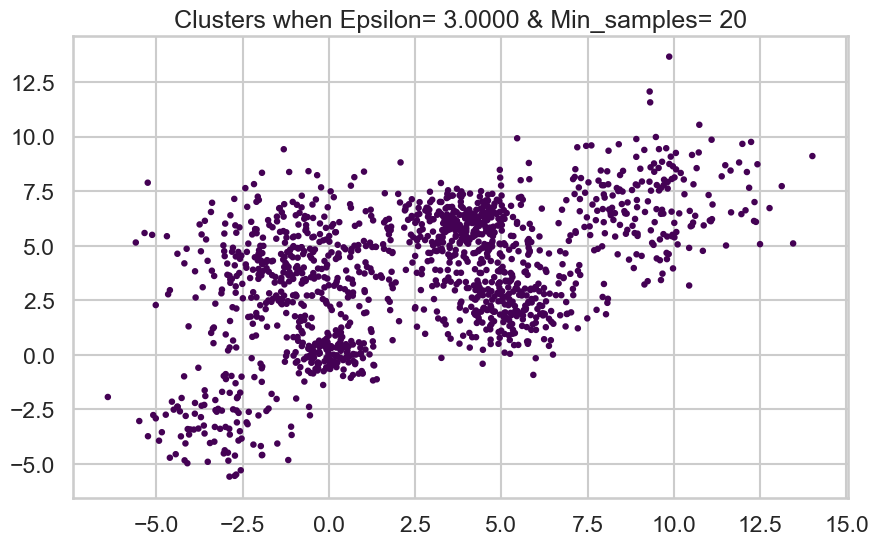

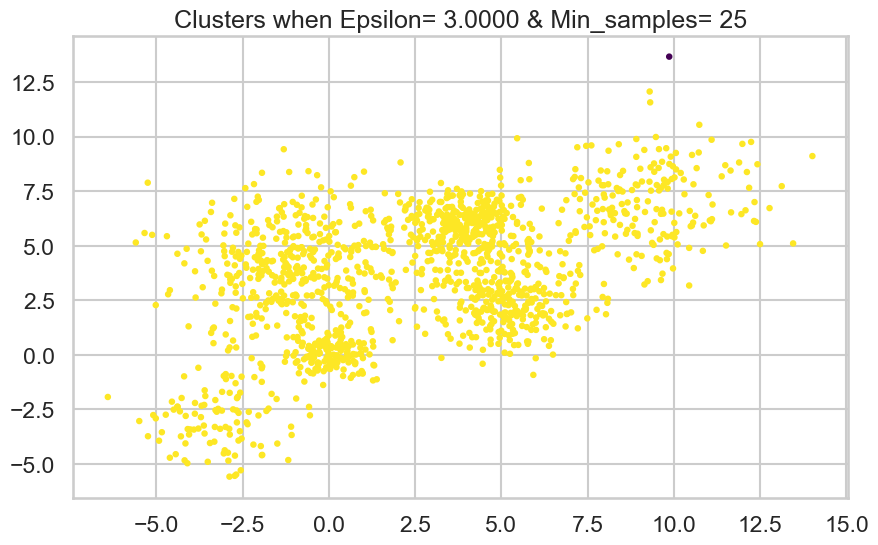

<Figure size 1000x600 with 0 Axes>

In [26]:
for i in np.arange(0.1,3.58,0.58):
    for j in range(5,30,5):
        DB = DBSCAN(eps = i, min_samples = j).fit(Multi_blob_Data)
        plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:,1], c = DB.labels_, s= 10, cmap= "viridis")
        plt.title('Clusters when Epsilon= %.4f & Min_samples= %d' % (i,j))
        plt.figure()

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [12]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Customer dataset
Repeat all the above on the customer data set 